In [1]:
# importlib: 사용자가 파이썬의 import 시스템과 상호작용하기 위한 API를 제공하는 내장 라이브러리
# 사용자는 import 함수의 구현 내용과, 실행에 필요한 하위 함수들을 이용해 필요에 맞는 임포터를 직접 구현하거나 임포트 관련 기능들을 자유롭게 사용할 수 있음
# importlib.metadata: 설치된 패키지 메타 데이터에 대한 접근을 제공하는 라이브러리.
# 해당 코드 블럭에서는 importlib.metadata 안에 있는 version() 함수를 이용하여 pixellib 라이브러리의 버전을 확인

from importlib.metadata import version
import cv2
import pixellib

print(cv2.__version__)
print(version('pixellib'))

4.5.3
0.7.1


In [2]:
# os: Operating System의 줄임말로, 운영체제에서 제공되는 여러 기능을 파이썬에서 사용할 수 있도록 함 (Ex. 디렉토리 경로 이동, 시스템 환경 변수 가져오기 등)
# urllib: URL 작업을 위한 여러 모듈을 모은 패키지. (Ex. urllib.request, urllib.parse, ...)
# cv2: OpenCV 라이브러리로, 실시간 컴퓨터 비전을 목적으로 한 프로그래밍 라이브러리
# numpy(NumPy): 행렬이나 대규모 다차원 배열을 쉽게 처리할 수 있도록 지원하는 라이브러리. 데이터 구조 외에도 수치 계산을 위해 효율적으로 구현된 기능을 제공
# pixellib: 이미지 및 비디오 segmentation을 수행하기 위한 라이브러리. 
# pixellib.semantic: segmentation 기법 중, semantic segmentation을 쉽게 사용할 수 있도록 만든 라이브러리
# matplotlib: 파이썬 프로그래밍 언어 및 수학적 확장 NumPy 라이브러리를 활용한 플로팅 라이브러리로, 데이터 시각화 도구
import os
import urllib
import cv2
import numpy as np
from pixellib.semantic import semantic_segmentation
from matplotlib import pyplot as plt

Matplotlib is building the font cache; this may take a moment.


In [3]:
#모델이 deeplabv3_xception_tf_dim_ordering_tf_kernels.h5 
#이름으로 이미 다운이 받아져있다. 
#따라서 모델 파일명을 사용하여 세그멘테이션 모델을 생성하려고한다
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models' 
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5') 
#Pixelib로 사용할 세그멘테이션 모델을 생성하기
model = semantic_segmentation() #PixelLib 라이브러리 에서 가져온 클래스를 가져와서 semantic segmentation을 수행하는 클래스 인스턴스를 만듬
model.load_pascalvoc_model(model_file) # pascal voc에 대해 훈련된 예외 모델(model_file)을 로드하는 함수를 호출

In [4]:
#pascalvoc 데이터의 라벨종류
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

In [93]:
# 컬러맵 만들기
def make_segmap(num, output):
    #컬러맵 만들기 
    colormap = np.zeros((256, 3), dtype = int)
    ind = np.arange(256, dtype=int)

    for shift in reversed(range(8)):
        for channel in range(3):
            colormap[:, channel] |= ((ind >> channel) & 1) << shift
        ind >>= 3

    print(colormap[num]) #컬러맵 15에 해당하는 배열 출력 (pacalvoc에 LABEL_NAMES 15번째인 사람)
    seg_color = (colormap[num,2],colormap[num,1],colormap[num,0])
    
    # seg_color로만 이루어진 mask만들기!!!

    # output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다
    # seg_color 값이 person을 값이 므로 사람이 있는 위치를 제외하고는 gray로 출력
    # cmap 값을 변경하면 다른 색상으로 확인이 가능함
    seg_map = np.all(output==seg_color, axis=-1) 
    return seg_map

In [6]:
def img_separation(img_orig, seg_map):
    # 원본이미지를 img_show에 할당한뒤 이미지 사람이 있는 위치와 배경을 분리해서 표현한 color_mask 를 만든뒤 두 이미지를 합쳐서 출력
    img_show = img_orig.copy()

    # True과 False인 값을 각각 255과 0으로 바꿔줍니다
    img_mask = seg_map.astype(np.uint8) * 255

    # 255와 0을 적당한 색상으로 바꿔봅니다
    color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

    # 원본 이미지와 마스트를 적당히 합쳐봅니다
    # 0.6과 0.4는 두 이미지를 섞는 비율입니다.
    img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)
    
    return img_show, img_mask

In [7]:
def blur_only_bg(img_mask, img_orig_blur):
    # 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경) 
    img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
    # cv2.bitwise_not(): 이미지가 반전됩니다. 배경이 0 사람이 255 였으나
    # 연산을 하고 나면 배경은 255 사람은 0입니다.
    img_bg_mask = cv2.bitwise_not(img_mask_color)
    # cv2.bitwise_and()을 사용하면 배경만 있는 영상을 얻을 수 있습니다.
    # 0과 어떤 수를 bitwise_and 연산을 해도 0이 되기 때문에 
    # 사람이 0인 경우에는 사람이 있던 모든 픽셀이 0이 됩니다. 결국 사람이 사라지고 배경만 남아요!
    img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
    return img_mask_color, img_bg_blur

In [8]:
def blur_only_object(img_mask, img_orig_blur):
    img_mask = cv2.bitwise_not(img_mask)
    img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
    img_obj_blur = cv2.bitwise_or(img_origin_blur, img_mask_color)
    return img_mask_color, img_obj_blur

### 단순한 배경에 사람 한명 vs 복잡한 배경에 사람 한명

In [9]:
# img path & show image
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/simple_bg_person.png'
img_orig = cv2.imread(img_path)

#### segmentation으로 사람을 분리하기

In [14]:
seg_v, output = model.segmentAsPascalvoc(img_path)

In [11]:
#segvalues에 있는 라벨 프린트하기
for class_id in seg_v['class_ids']:
    print(LABEL_NAMES[class_id])
# mask가 씌워진 이미지 프린트하기
seg_map = make_segmap(output)
#이미지에서 사람이 있는 위치와 배경을 분리해서 표현한 color_mask를 만든뒤 두 
#이미지를 합쳐서 출력
img_show, img_mask = img_separation(img_orig, seg_map)
# 배경 흐리게 만들기
# (13,13)은 blurring kernel size를 뜻합니다
# 다양하게 바꿔보세요
img_orig_blur = cv2.blur(img_orig, (13,13))
img_mask_color, img_bg_blur = blur_only_bg(img_mask, img_orig_blur)
# 블러 처리된 배경과 사람부분 마스크를 합치기!!

# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고 
# 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)

background
person
[192 128 128]


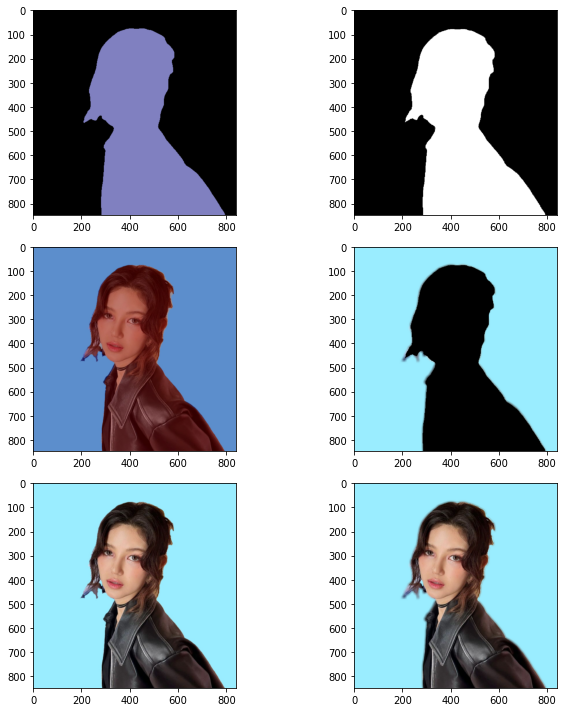

In [13]:
fig, ax =plt.subplots(3,2, figsize=(10,10)) 
ax[0][0].imshow(output) 
ax[0][1].imshow(seg_map, cmap='gray') 
ax[1][0].imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)) 
ax[1][1].imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB)) 
ax[2][0].imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)) 
ax[2][1].imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB)) 

fig.tight_layout()
plt.show()

#### 복잡한 배경

In [15]:
# img path & show image
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/complex_bg_person.png'
img_orig = img_orig = cv2.imread(img_path)

#### segmentation으로 사람을 분리하기

In [16]:
seg_v, output = model.segmentAsPascalvoc(img_path)

In [17]:
#segvalues에 있는 라벨 프린트하기
for class_id in seg_v['class_ids']:
    print(LABEL_NAMES[class_id])
# mask가 씌워진 이미지 프린트하기
seg_map = make_segmap(output)
#이미지에서 사람이 있는 위치와 배경을 분리해서 표현한 color_mask를 만든뒤 두 
#이미지를 합쳐서 출력
img_show, img_mask = img_separation(img_orig, seg_map)
# 배경 흐리게 만들기
# (13,13)은 blurring kernel size를 뜻합니다
# 다양하게 바꿔보세요
img_orig_blur = cv2.blur(img_orig, (13,13))
img_mask_color, img_bg_blur = blur_only_bg(img_mask, img_orig_blur)
# 블러 처리된 배경과 사람부분 마스크를 합치기!!

# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고 
# 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)

background
cat
person
[192 128 128]


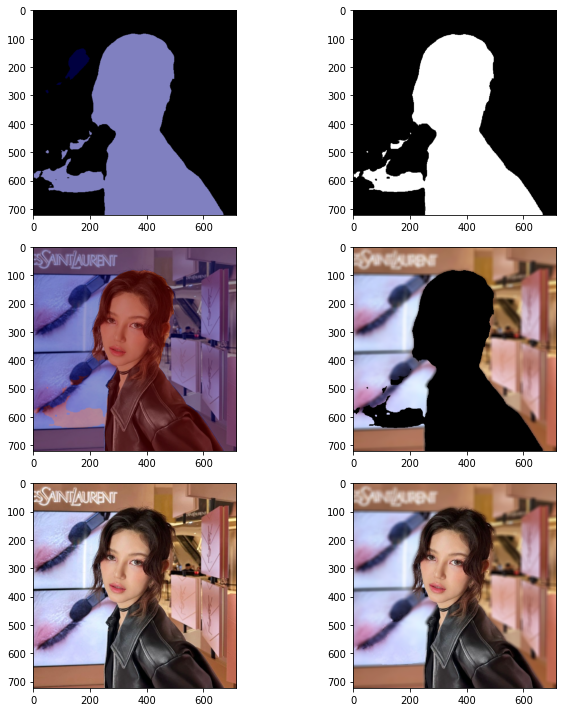

In [18]:
fig, ax =plt.subplots(3,2, figsize=(10,10)) 
ax[0][0].imshow(output) 
ax[0][1].imshow(seg_map, cmap='gray') 
ax[1][0].imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)) 
ax[1][1].imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB)) 
ax[2][0].imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)) 
ax[2][1].imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB)) 

fig.tight_layout()
plt.show()

결과물에서는 딱히 큰 이상은 없어보이지만 마스크를 보게되면 다른 부분도 사람으로 인식하거나 고양이가 아닌데 고양이로 인식하는 경우가 있는 것 같다.

### 배경에 따라 사람이 여러명있는 사진에서는 어떻게 나올까?

In [20]:
# img path & show image
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/friends_group.png'
img_orig = img_orig = cv2.imread(img_path)

#### segmentation으로 사람을 분리하기

In [21]:
seg_v, output = model.segmentAsPascalvoc(img_path)

In [24]:
#segvalues에 있는 라벨 프린트하기
for class_id in seg_v['class_ids']:
    print(LABEL_NAMES[class_id])
# mask가 씌워진 이미지 프린트하기
seg_map = make_segmap(output)
#이미지에서 사람이 있는 위치와 배경을 분리해서 표현한 color_mask를 만든뒤 두 
#이미지를 합쳐서 출력
img_show, img_mask = img_separation(img_orig, seg_map)
# 배경 흐리게 만들기
# (13,13)은 blurring kernel size를 뜻합니다
# 다양하게 바꿔보세요
img_orig_blur = cv2.blur(img_orig, (40,40))
img_mask_color, img_bg_blur = blur_only_bg(img_mask, img_orig_blur)
# 블러 처리된 배경과 사람부분 마스크를 합치기!!

# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고 
# 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)

background
person
[192 128 128]


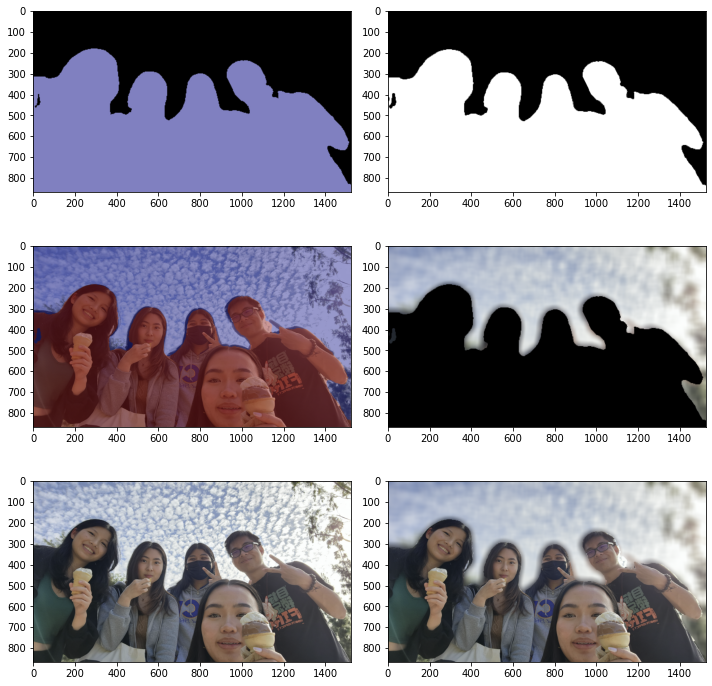

In [25]:
fig, ax =plt.subplots(3,2, figsize=(10,10)) 
ax[0][0].imshow(output) 
ax[0][1].imshow(seg_map, cmap='gray') 
ax[1][0].imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)) 
ax[1][1].imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB)) 
ax[2][0].imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)) 
ax[2][1].imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB)) 

fig.tight_layout()
plt.show()

위 사진의 경우 배경이 너무 간단해서 사람들을 쉽게 인식하는 것이 아닐까 생각이 든다. 배경이 조금 더 복잡한 걸 써보려고한다.

In [26]:
# img path & show image
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/group_of_ppl.png'
img_orig = img_orig = cv2.imread(img_path)

#### segmentation으로 사람을 분리하기

In [27]:
seg_v, output = model.segmentAsPascalvoc(img_path)

In [30]:
#segvalues에 있는 라벨 프린트하기
for class_id in seg_v['class_ids']:
    print(LABEL_NAMES[class_id])
# mask가 씌워진 이미지 프린트하기
seg_map = make_segmap(output)
#이미지에서 사람이 있는 위치와 배경을 분리해서 표현한 color_mask를 만든뒤 두 
#이미지를 합쳐서 출력
img_show, img_mask = img_separation(img_orig, seg_map)
# 배경 흐리게 만들기
# (13,13)은 blurring kernel size를 뜻합니다
# 다양하게 바꿔보세요
img_orig_blur = cv2.blur(img_orig, (80,80))
img_mask_color, img_bg_blur = blur_only_bg(img_mask, img_orig_blur)
# 블러 처리된 배경과 사람부분 마스크를 합치기!!

# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고 
# 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)

background
person
[192 128 128]


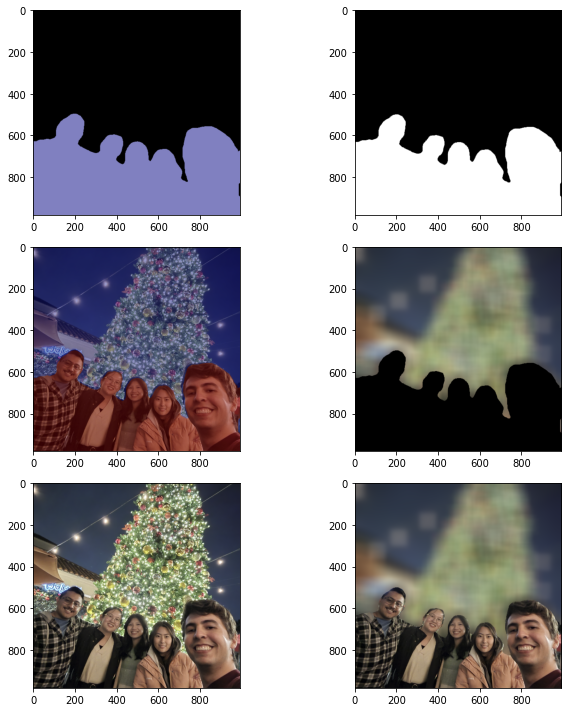

In [31]:
fig, ax =plt.subplots(3,2, figsize=(10,10)) 
ax[0][0].imshow(output) 
ax[0][1].imshow(seg_map, cmap='gray') 
ax[1][0].imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)) 
ax[1][1].imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB)) 
ax[2][0].imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)) 
ax[2][1].imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB)) 

fig.tight_layout()
plt.show()

사진 자체가 흐린것 같아 blur filter에 값을 높게 넣어서 해보았다. 사람들의 형체가 주변 사물과 딱히 얽혀있지 않아 사람과 배경을 잘 구별해내는것같다.

* 많은 사람들과 패턴같은 배경이 섞여진다면 어떻게 나올까?

In [35]:
# img path & show image
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/many_ppl_complex_bg.png'
img_orig = img_orig = cv2.imread(img_path)

#### segmentation으로 사람을 분리하기

In [36]:
seg_v, output = model.segmentAsPascalvoc(img_path)

In [37]:
#segvalues에 있는 라벨 프린트하기
for class_id in seg_v['class_ids']:
    print(LABEL_NAMES[class_id])
# mask가 씌워진 이미지 프린트하기
seg_map = make_segmap(output)
#이미지에서 사람이 있는 위치와 배경을 분리해서 표현한 color_mask를 만든뒤 두 
#이미지를 합쳐서 출력
img_show, img_mask = img_separation(img_orig, seg_map)
# 배경 흐리게 만들기
# (13,13)은 blurring kernel size를 뜻합니다
# 다양하게 바꿔보세요
img_orig_blur = cv2.blur(img_orig, (40,40))
img_mask_color, img_bg_blur = blur_only_bg(img_mask, img_orig_blur)
# 블러 처리된 배경과 사람부분 마스크를 합치기!!

# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고 
# 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)

background
person
pottedplant
[192 128 128]


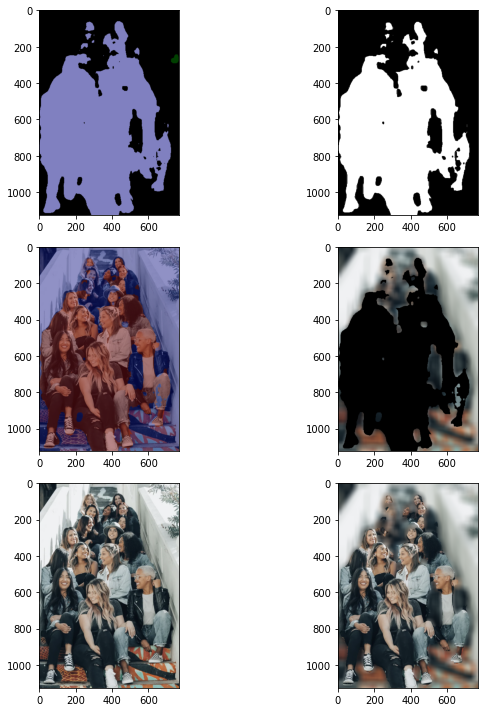

In [38]:
fig, ax =plt.subplots(3,2, figsize=(10,10)) 
ax[0][0].imshow(output) 
ax[0][1].imshow(seg_map, cmap='gray') 
ax[1][0].imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)) 
ax[1][1].imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB)) 
ax[2][0].imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)) 
ax[2][1].imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB)) 

fig.tight_layout()
plt.show()

계단의 패턴과는 상관없이 사람이 매우 많을 때는 사람들을 전부 인식하지는 못하는 것 같다.

### 한 사람일경우 사람 몸 전체가 나온 사진 vs 상체만 나온 사진

In [39]:
# img path & show image
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/single_person.png'
img_orig = img_orig = cv2.imread(img_path)

#### segmentation으로 사람을 분리하기

In [40]:
seg_v, output = model.segmentAsPascalvoc(img_path)

In [41]:
#segvalues에 있는 라벨 프린트하기
for class_id in seg_v['class_ids']:
    print(LABEL_NAMES[class_id])
# mask가 씌워진 이미지 프린트하기
seg_map = make_segmap(output)
#이미지에서 사람이 있는 위치와 배경을 분리해서 표현한 color_mask를 만든뒤 두 
#이미지를 합쳐서 출력
img_show, img_mask = img_separation(img_orig, seg_map)
# 배경 흐리게 만들기
# (13,13)은 blurring kernel size를 뜻합니다
# 다양하게 바꿔보세요
img_orig_blur = cv2.blur(img_orig, (13,13))
img_mask_color, img_bg_blur = blur_only_bg(img_mask, img_orig_blur)
# 블러 처리된 배경과 사람부분 마스크를 합치기!!

# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고 
# 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)

background
person
pottedplant
[192 128 128]


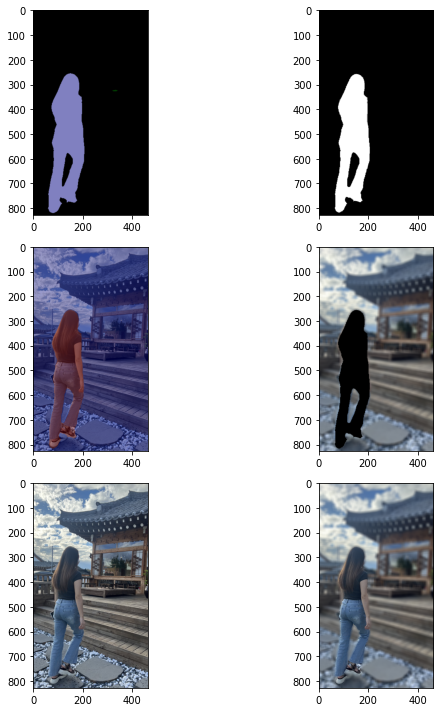

In [42]:
fig, ax =plt.subplots(3,2, figsize=(10,10)) 
ax[0][0].imshow(output) 
ax[0][1].imshow(seg_map, cmap='gray') 
ax[1][0].imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)) 
ax[1][1].imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB)) 
ax[2][0].imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)) 
ax[2][1].imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB)) 

fig.tight_layout()
plt.show()

* 상체만

In [44]:
# img path & show image
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/single_person_not_full.png'
img_orig = img_orig = cv2.imread(img_path)

#### segmentation으로 사람을 분리하기

In [45]:
seg_v, output = model.segmentAsPascalvoc(img_path)

In [46]:
#segvalues에 있는 라벨 프린트하기
for class_id in seg_v['class_ids']:
    print(LABEL_NAMES[class_id])
# mask가 씌워진 이미지 프린트하기
seg_map = make_segmap(output)
#이미지에서 사람이 있는 위치와 배경을 분리해서 표현한 color_mask를 만든뒤 두 
#이미지를 합쳐서 출력
img_show, img_mask = img_separation(img_orig, seg_map)
# 배경 흐리게 만들기
# (13,13)은 blurring kernel size를 뜻합니다
# 다양하게 바꿔보세요
img_orig_blur = cv2.blur(img_orig, (13,13))
img_mask_color, img_bg_blur = blur_only_bg(img_mask, img_orig_blur)
# 블러 처리된 배경과 사람부분 마스크를 합치기!!

# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고 
# 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)

background
person
[192 128 128]


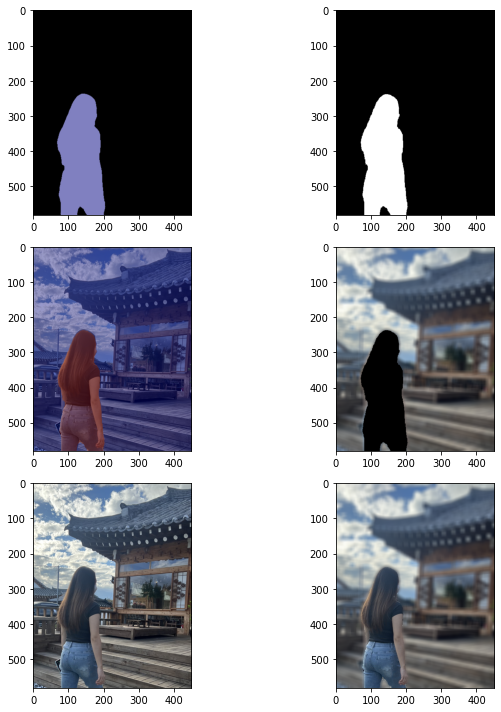

In [47]:
fig, ax =plt.subplots(3,2, figsize=(10,10)) 
ax[0][0].imshow(output) 
ax[0][1].imshow(seg_map, cmap='gray') 
ax[1][0].imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)) 
ax[1][1].imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB)) 
ax[2][0].imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)) 
ax[2][1].imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB)) 

fig.tight_layout()
plt.show()

같은 사진에서도 몸 전체가 다 보이게, 상체만 보이게 조정해서 실험을 해봤다. 둘 다 예상대로 제대로 된 결과가 나온 것으로 보아 상체든 전체든 사람으로 인식을 잘하는 걸 알 수 있다.

### 밝은 바탕일때 vs 흑백일때 vs 독특한 조명일때 

* 원본 바탕

In [48]:
# img path & show image
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/original_color.png'
img_orig = img_orig = cv2.imread(img_path)

#### segmentation으로 사람을 분리하기

In [49]:
seg_v, output = model.segmentAsPascalvoc(img_path)

In [50]:
#segvalues에 있는 라벨 프린트하기
for class_id in seg_v['class_ids']:
    print(LABEL_NAMES[class_id])
# mask가 씌워진 이미지 프린트하기
seg_map = make_segmap(output)
#이미지에서 사람이 있는 위치와 배경을 분리해서 표현한 color_mask를 만든뒤 두 
#이미지를 합쳐서 출력
img_show, img_mask = img_separation(img_orig, seg_map)
# 배경 흐리게 만들기
# (13,13)은 blurring kernel size를 뜻합니다
# 다양하게 바꿔보세요
img_orig_blur = cv2.blur(img_orig, (13,13))
img_mask_color, img_bg_blur = blur_only_bg(img_mask, img_orig_blur)
# 블러 처리된 배경과 사람부분 마스크를 합치기!!

# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고 
# 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)

background
person
[192 128 128]


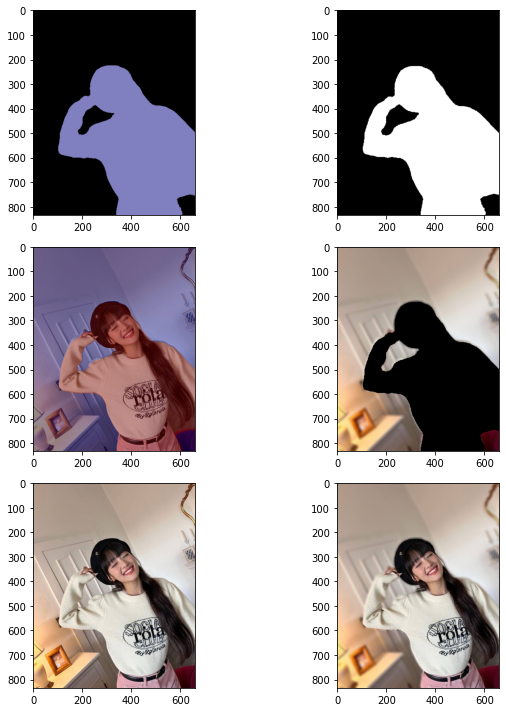

In [51]:
fig, ax =plt.subplots(3,2, figsize=(10,10)) 
ax[0][0].imshow(output) 
ax[0][1].imshow(seg_map, cmap='gray') 
ax[1][0].imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)) 
ax[1][1].imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB)) 
ax[2][0].imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)) 
ax[2][1].imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB)) 

fig.tight_layout()
plt.show()

* 흑백 사진

In [54]:
# img path & show image
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/gray_color.png'
img_orig = img_orig = cv2.imread(img_path)

#### segmentation으로 사람을 분리하기

In [55]:
seg_v, output = model.segmentAsPascalvoc(img_path)

In [56]:
#segvalues에 있는 라벨 프린트하기
for class_id in seg_v['class_ids']:
    print(LABEL_NAMES[class_id])
# mask가 씌워진 이미지 프린트하기
seg_map = make_segmap(output)
#이미지에서 사람이 있는 위치와 배경을 분리해서 표현한 color_mask를 만든뒤 두 
#이미지를 합쳐서 출력
img_show, img_mask = img_separation(img_orig, seg_map)
# 배경 흐리게 만들기
# (13,13)은 blurring kernel size를 뜻합니다
# 다양하게 바꿔보세요
img_orig_blur = cv2.blur(img_orig, (13,13))
img_mask_color, img_bg_blur = blur_only_bg(img_mask, img_orig_blur)
# 블러 처리된 배경과 사람부분 마스크를 합치기!!

# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고 
# 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)

background
person
[192 128 128]


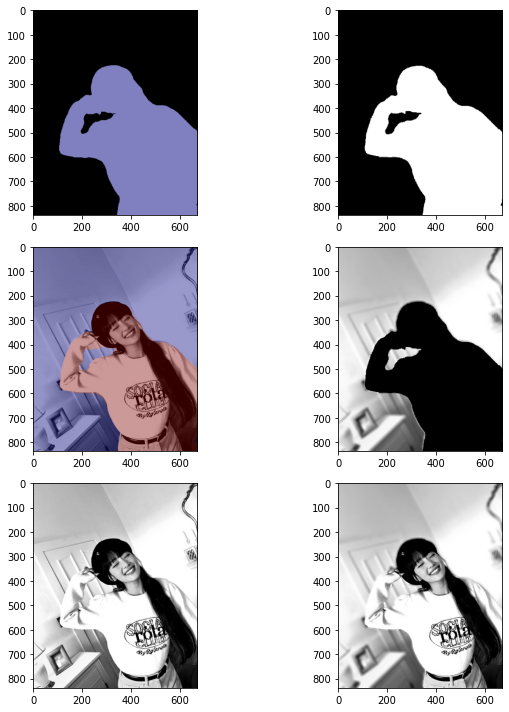

In [57]:
fig, ax =plt.subplots(3,2, figsize=(10,10)) 
ax[0][0].imshow(output) 
ax[0][1].imshow(seg_map, cmap='gray') 
ax[1][0].imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)) 
ax[1][1].imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB)) 
ax[2][0].imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)) 
ax[2][1].imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB)) 

fig.tight_layout()
plt.show()

* 빨간색

In [58]:
# img path & show image
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/red_color.png'
img_orig = img_orig = cv2.imread(img_path)

#### segmentation으로 사람을 분리하기

In [59]:
seg_v, output = model.segmentAsPascalvoc(img_path)

In [60]:
#segvalues에 있는 라벨 프린트하기
for class_id in seg_v['class_ids']:
    print(LABEL_NAMES[class_id])
# mask가 씌워진 이미지 프린트하기
seg_map = make_segmap(output)
#이미지에서 사람이 있는 위치와 배경을 분리해서 표현한 color_mask를 만든뒤 두 
#이미지를 합쳐서 출력
img_show, img_mask = img_separation(img_orig, seg_map)
# 배경 흐리게 만들기
# (13,13)은 blurring kernel size를 뜻합니다
# 다양하게 바꿔보세요
img_orig_blur = cv2.blur(img_orig, (13,13))
img_mask_color, img_bg_blur = blur_only_bg(img_mask, img_orig_blur)
# 블러 처리된 배경과 사람부분 마스크를 합치기!!

# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고 
# 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)

background
person
[192 128 128]


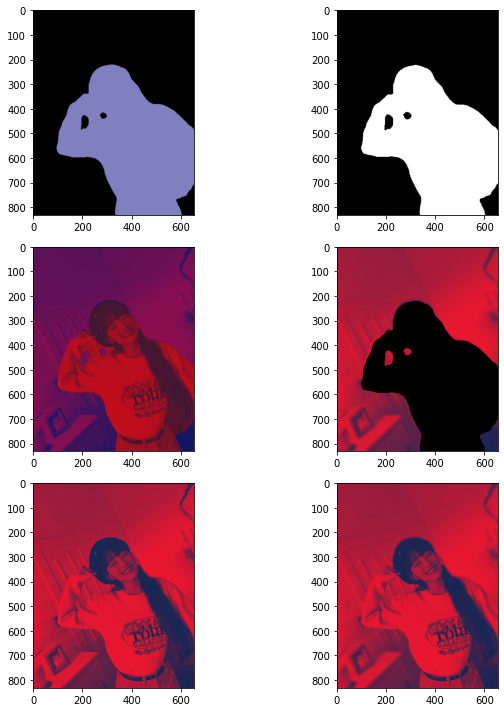

In [61]:
fig, ax =plt.subplots(3,2, figsize=(10,10)) 
ax[0][0].imshow(output) 
ax[0][1].imshow(seg_map, cmap='gray') 
ax[1][0].imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)) 
ax[1][1].imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB)) 
ax[2][0].imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)) 
ax[2][1].imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB)) 

fig.tight_layout()
plt.show()

* orange 컬러

In [62]:
# img path & show image
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/orange_color.png'
img_orig = img_orig = cv2.imread(img_path)

#### segmentation으로 사람을 분리하기

In [63]:
seg_v, output = model.segmentAsPascalvoc(img_path)

In [64]:
#segvalues에 있는 라벨 프린트하기
for class_id in seg_v['class_ids']:
    print(LABEL_NAMES[class_id])
# mask가 씌워진 이미지 프린트하기
seg_map = make_segmap(output)
#이미지에서 사람이 있는 위치와 배경을 분리해서 표현한 color_mask를 만든뒤 두 
#이미지를 합쳐서 출력
img_show, img_mask = img_separation(img_orig, seg_map)
# 배경 흐리게 만들기
# (13,13)은 blurring kernel size를 뜻합니다
# 다양하게 바꿔보세요
img_orig_blur = cv2.blur(img_orig, (13,13))
img_mask_color, img_bg_blur = blur_only_bg(img_mask, img_orig_blur)
# 블러 처리된 배경과 사람부분 마스크를 합치기!!

# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고 
# 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)

background
person
[192 128 128]


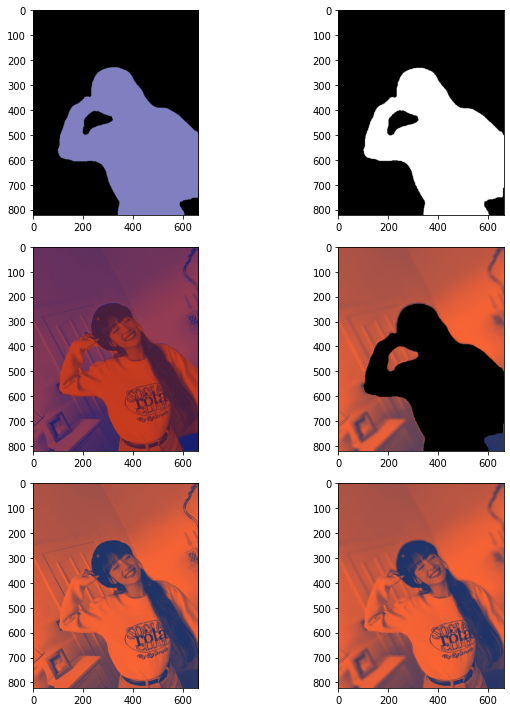

In [65]:
fig, ax =plt.subplots(3,2, figsize=(10,10)) 
ax[0][0].imshow(output) 
ax[0][1].imshow(seg_map, cmap='gray') 
ax[1][0].imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)) 
ax[1][1].imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB)) 
ax[2][0].imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)) 
ax[2][1].imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB)) 

fig.tight_layout()
plt.show()

* yellow 컬러

In [66]:
# img path & show image
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/yellow_color.png'
img_orig = img_orig = cv2.imread(img_path)

#### segmentation으로 사람을 분리하기

In [67]:
seg_v, output = model.segmentAsPascalvoc(img_path)

In [68]:
#segvalues에 있는 라벨 프린트하기
for class_id in seg_v['class_ids']:
    print(LABEL_NAMES[class_id])
# mask가 씌워진 이미지 프린트하기
seg_map = make_segmap(output)
#이미지에서 사람이 있는 위치와 배경을 분리해서 표현한 color_mask를 만든뒤 두 
#이미지를 합쳐서 출력
img_show, img_mask = img_separation(img_orig, seg_map)
# 배경 흐리게 만들기
# (13,13)은 blurring kernel size를 뜻합니다
# 다양하게 바꿔보세요
img_orig_blur = cv2.blur(img_orig, (13,13))
img_mask_color, img_bg_blur = blur_only_bg(img_mask, img_orig_blur)
# 블러 처리된 배경과 사람부분 마스크를 합치기!!

# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고 
# 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)

background
person
[192 128 128]


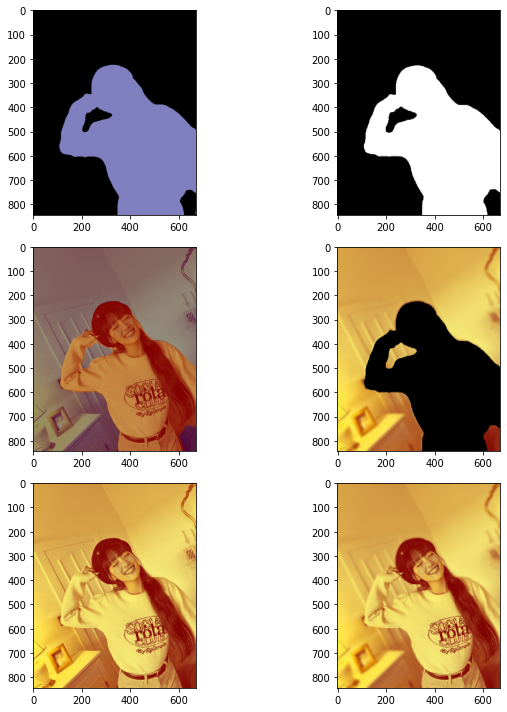

In [69]:
fig, ax =plt.subplots(3,2, figsize=(10,10)) 
ax[0][0].imshow(output) 
ax[0][1].imshow(seg_map, cmap='gray') 
ax[1][0].imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)) 
ax[1][1].imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB)) 
ax[2][0].imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)) 
ax[2][1].imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB)) 

fig.tight_layout()
plt.show()

* pink 컬러

In [73]:
# img path & show image
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/pink_color.png'
img_orig = img_orig = cv2.imread(img_path)

#### segmentation으로 사람을 분리하기

In [74]:
seg_v, output = model.segmentAsPascalvoc(img_path)

In [75]:
#segvalues에 있는 라벨 프린트하기
for class_id in seg_v['class_ids']:
    print(LABEL_NAMES[class_id])
# mask가 씌워진 이미지 프린트하기
seg_map = make_segmap(output)
#이미지에서 사람이 있는 위치와 배경을 분리해서 표현한 color_mask를 만든뒤 두 
#이미지를 합쳐서 출력
img_show, img_mask = img_separation(img_orig, seg_map)
# 배경 흐리게 만들기
# (13,13)은 blurring kernel size를 뜻합니다
# 다양하게 바꿔보세요
img_orig_blur = cv2.blur(img_orig, (13,13))
img_mask_color, img_bg_blur = blur_only_bg(img_mask, img_orig_blur)
# 블러 처리된 배경과 사람부분 마스크를 합치기!!

# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고 
# 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)

background
person
[192 128 128]


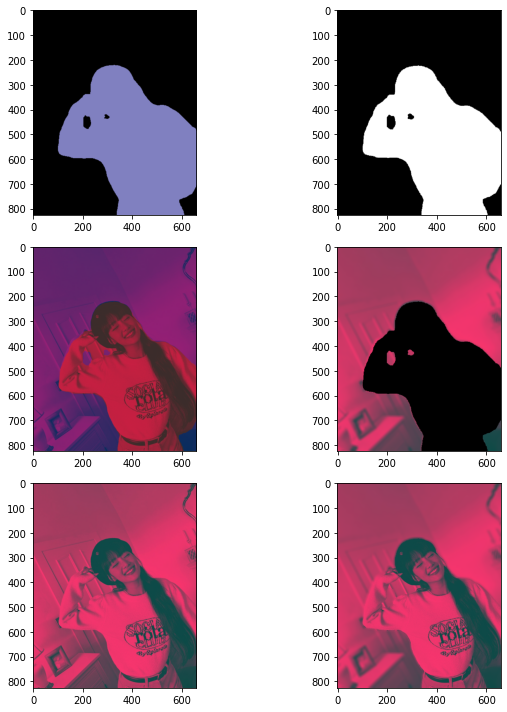

In [76]:
fig, ax =plt.subplots(3,2, figsize=(10,10)) 
ax[0][0].imshow(output) 
ax[0][1].imshow(seg_map, cmap='gray') 
ax[1][0].imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)) 
ax[1][1].imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB)) 
ax[2][0].imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)) 
ax[2][1].imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB)) 

fig.tight_layout()
plt.show()

* green 컬러

In [77]:
# img path & show image
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/green_color.png'
img_orig = img_orig = cv2.imread(img_path)

#### segmentation으로 사람을 분리하기

In [78]:
seg_v, output = model.segmentAsPascalvoc(img_path)

In [79]:
#segvalues에 있는 라벨 프린트하기
for class_id in seg_v['class_ids']:
    print(LABEL_NAMES[class_id])
# mask가 씌워진 이미지 프린트하기
seg_map = make_segmap(output)
#이미지에서 사람이 있는 위치와 배경을 분리해서 표현한 color_mask를 만든뒤 두 
#이미지를 합쳐서 출력
img_show, img_mask = img_separation(img_orig, seg_map)
# 배경 흐리게 만들기
# (13,13)은 blurring kernel size를 뜻합니다
# 다양하게 바꿔보세요
img_orig_blur = cv2.blur(img_orig, (13,13))
img_mask_color, img_bg_blur = blur_only_bg(img_mask, img_orig_blur)
# 블러 처리된 배경과 사람부분 마스크를 합치기!!

# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고 
# 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)

background
bottle
person
[192 128 128]


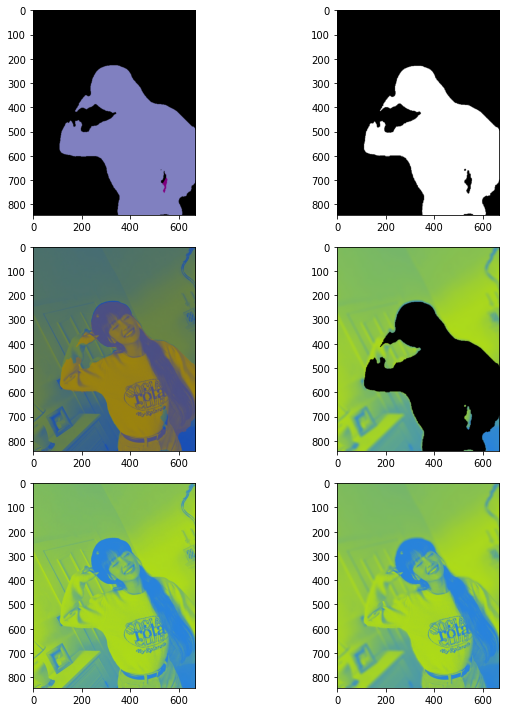

In [80]:
fig, ax =plt.subplots(3,2, figsize=(10,10)) 
ax[0][0].imshow(output) 
ax[0][1].imshow(seg_map, cmap='gray') 
ax[1][0].imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)) 
ax[1][1].imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB)) 
ax[2][0].imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)) 
ax[2][1].imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB)) 

fig.tight_layout()
plt.show()

* blue color

In [81]:
# img path & show image
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/blue_color.png'
img_orig = img_orig = cv2.imread(img_path)

#### segmentation으로 사람을 분리하기

In [82]:
seg_v, output = model.segmentAsPascalvoc(img_path)

In [83]:
#segvalues에 있는 라벨 프린트하기
for class_id in seg_v['class_ids']:
    print(LABEL_NAMES[class_id])
# mask가 씌워진 이미지 프린트하기
seg_map = make_segmap(output)
#이미지에서 사람이 있는 위치와 배경을 분리해서 표현한 color_mask를 만든뒤 두 
#이미지를 합쳐서 출력
img_show, img_mask = img_separation(img_orig, seg_map)
# 배경 흐리게 만들기
# (13,13)은 blurring kernel size를 뜻합니다
# 다양하게 바꿔보세요
img_orig_blur = cv2.blur(img_orig, (13,13))
img_mask_color, img_bg_blur = blur_only_bg(img_mask, img_orig_blur)
# 블러 처리된 배경과 사람부분 마스크를 합치기!!

# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고 
# 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)

background
person
[192 128 128]


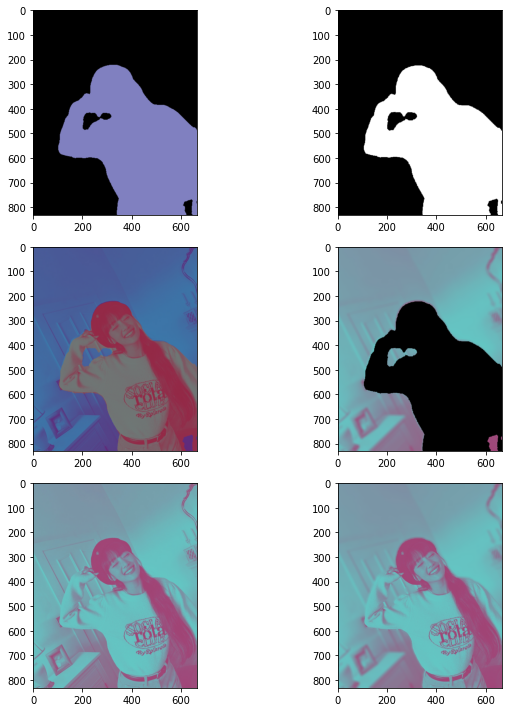

In [84]:
fig, ax =plt.subplots(3,2, figsize=(10,10)) 
ax[0][0].imshow(output) 
ax[0][1].imshow(seg_map, cmap='gray') 
ax[1][0].imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)) 
ax[1][1].imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB)) 
ax[2][0].imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)) 
ax[2][1].imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB)) 

fig.tight_layout()
plt.show()

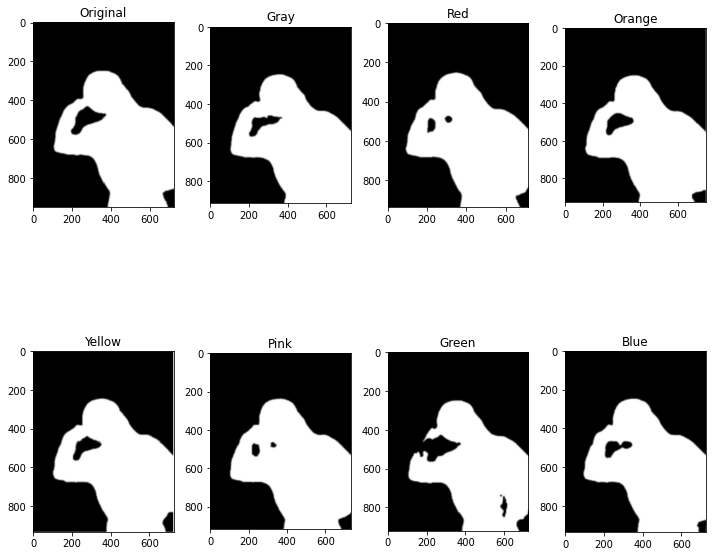

In [86]:
# 색깔별에 따른 mask 이미지 나타내기
colors = []
for i in range(8):
    string = str(i)
    path = os.getenv('HOME')+'/aiffel/human_segmentation/images/'+ string + '.png'
    img_orig = img_orig = cv2.imread(path)
    colors.append(img_orig)
fig, ax =plt.subplots(2,4, figsize=(10,10))
color_dict = {0: "Original", 1: "Gray", 2: "Red", 3:"Orange", 4: "Yellow", 5: "Pink", 6: "Green", 7: "Blue"}
for i in range(8):
    ax[i//4][i%4].imshow(colors[i], cmap = 'gray')
    ax[i//4][i%4].set_title(color_dict[i])

fig.tight_layout()
plt.show()

모든색이 사람을 인식하기는 하지만 색이 달라지면서 어떤 색은 제대로 인식하기도 하나 대부분의 색들이 제대로 인식을 못하는 것 같다.

위의 컬러 변화에 따른 실험을 한 이유는 독특한 조명에서 사람을 잘 인식할 수 있을까하는 의문때문이었다.
밑의 사진처럼 독특한 조명속에서 사람을 잘 잡아내는 portrait mode를 잘 만들어낼 수 있을까싶었다. 하지만 밑의 이미지로는 다양한 조명색 변화를 주지 못해 일반 밝은 이미지에 흑백, 빨강, 노랑, 주황, 분홍, 초록, 파랑을 넣어보고 실험을 해보았던 것이다. 
위의 이미지를 보면 주황, 노랑에서는 완벽하지는 않지만 나름 원본과 비슷한 결과를 얻어냈다고 보여지지만,흑백, 빨강, 분홍, 초록, 파랑에서는 원본만큼 제대로 인식하지 못한 것을 볼 수 있다. 분홍색도 빨간색에 가까운 분홍이라고 생각이 들어 혹시 조명이 RGB색에 거의 비슷하다면 제대로 인식을 못해내는 것일 수도 있겠다는 생각을 했다. 또한 흑백일때는 배경색과 인물색이 흰색이나 흑색으로 경계가 뚜렷하지 못하면 제대로 인식하지 못하는 경우가 발생하는 것 같다.<br>
위 실험을 하게 된 이유였던 원본 파일로 portrait mode 사진을 만들어보려고한다.

In [94]:
# img path & show image
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/center_one_many_ppl_with_weird_light.png'
img_orig = img_orig = cv2.imread(img_path)

#### segmentation으로 사람을 분리하기

In [95]:
seg_v, output = model.segmentAsPascalvoc(img_path)

In [97]:
#segvalues에 있는 라벨 프린트하기
for class_id in seg_v['class_ids']:
    print(LABEL_NAMES[class_id])
# mask가 씌워진 이미지 프린트하기
seg_map = make_segmap(15, output)
#이미지에서 사람이 있는 위치와 배경을 분리해서 표현한 color_mask를 만든뒤 두 
#이미지를 합쳐서 출력
img_show, img_mask = img_separation(img_orig, seg_map)
# 배경 흐리게 만들기
# (13,13)은 blurring kernel size를 뜻합니다
# 다양하게 바꿔보세요
img_orig_blur = cv2.blur(img_orig, (30,30))
img_mask_color, img_bg_blur = blur_only_bg(img_mask, img_orig_blur)
# 블러 처리된 배경과 사람부분 마스크를 합치기!!

# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고 
# 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)

background
person
tv
[192 128 128]


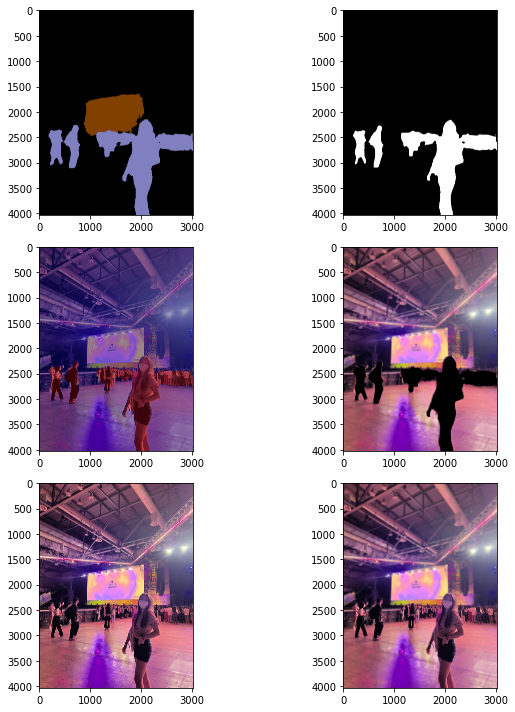

In [98]:
fig, ax =plt.subplots(3,2, figsize=(10,10)) 
ax[0][0].imshow(output) 
ax[0][1].imshow(seg_map, cmap='gray') 
ax[1][0].imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)) 
ax[1][1].imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB)) 
ax[2][0].imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)) 
ax[2][1].imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB)) 

fig.tight_layout()
plt.show()

조명이 문제가 될 수도 있겠다고 생각했지만 그다지 문제가 되지는 않는 것 같다. 굽히고 있는 팔 사이에 배경이 있지만 이것이 밝은 조명이었다면 탐지가 됐을지 의문이다. 따라서 이 사진을 흑백으로 만들어 실험해 보고자 한다. 또한 potrait mode에서는 앞에 있는 사람만 강조되었으면 하는데 여기서는 모든 사람들을 다 강조하는 것이 문제인것 같다.

In [99]:
# img path & show image
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/center_one_many_ppl_with_weird_light_gray.png'
img_orig = img_orig = cv2.imread(img_path)

#### segmentation으로 사람을 분리하기

In [100]:
seg_v, output = model.segmentAsPascalvoc(img_path)

In [101]:
#segvalues에 있는 라벨 프린트하기
for class_id in seg_v['class_ids']:
    print(LABEL_NAMES[class_id])
# mask가 씌워진 이미지 프린트하기
seg_map = make_segmap(15, output)
#이미지에서 사람이 있는 위치와 배경을 분리해서 표현한 color_mask를 만든뒤 두 
#이미지를 합쳐서 출력
img_show, img_mask = img_separation(img_orig, seg_map)
# 배경 흐리게 만들기
# (13,13)은 blurring kernel size를 뜻합니다
# 다양하게 바꿔보세요
img_orig_blur = cv2.blur(img_orig, (30,30))
img_mask_color, img_bg_blur = blur_only_bg(img_mask, img_orig_blur)
# 블러 처리된 배경과 사람부분 마스크를 합치기!!

# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고 
# 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)

background
person
[192 128 128]


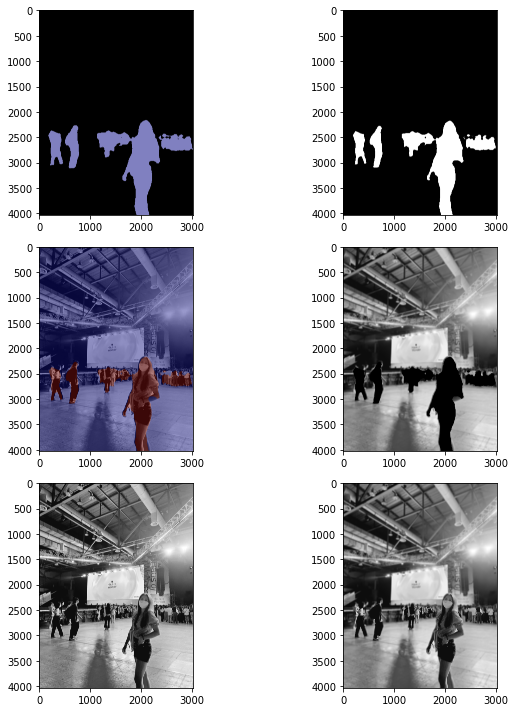

In [102]:
fig, ax =plt.subplots(3,2, figsize=(10,10)) 
ax[0][0].imshow(output) 
ax[0][1].imshow(seg_map, cmap='gray') 
ax[1][0].imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)) 
ax[1][1].imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB)) 
ax[2][0].imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)) 
ax[2][1].imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB)) 

fig.tight_layout()
plt.show()

혹시 흑백으로 바꾸면 팔쪽에서 바탕을 더 세세하게 구분할 수 있을까했는데 오히려 흑백사진에서 굽혀진 부분의 팔이 없어진 것을 발견했다.

## 인물사진에서의 문제점 모음
- 배경이 복잡할 수록 인물을 제대로 잡아내는데 어려움을 보임
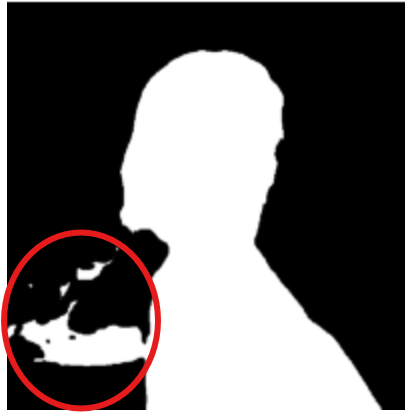<br>
- 인물이 브이를 하고있음에도 그것을 사람의 한 부분으로 인식하지 못하고 블러처리해버림
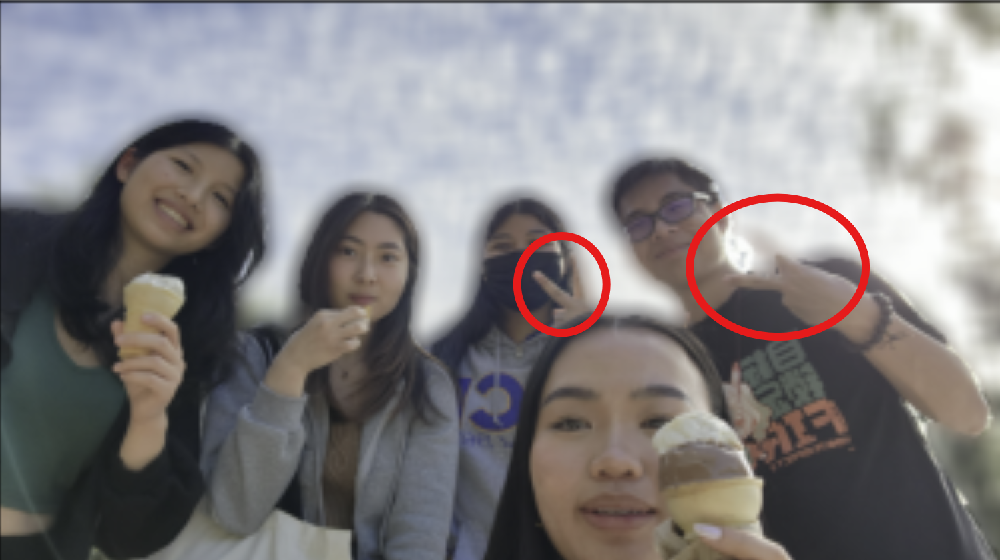<br>
- 머리 부분이 너무 많이 사라진다.
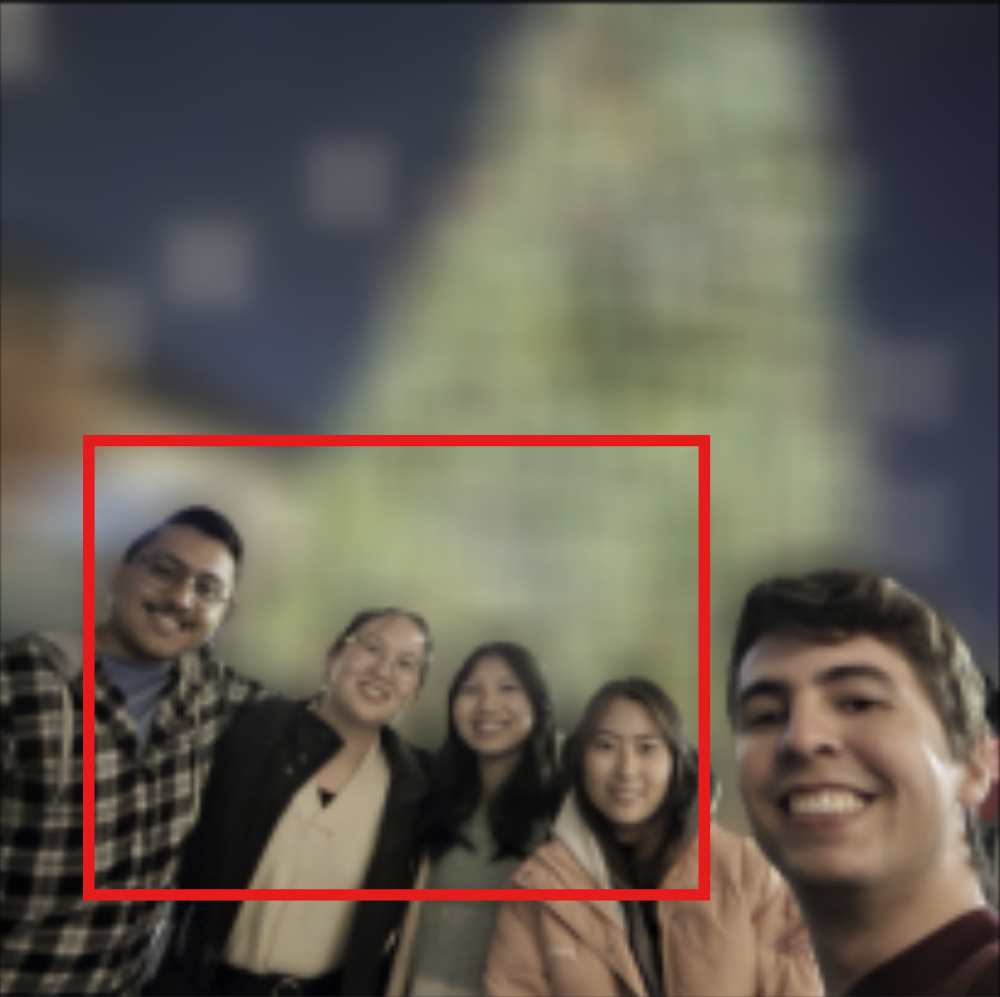<br>
- 너무나도 많은 사람들을 포커싱에 넣으려고할 때 모든 사람들이 다 잡히지 않는다.
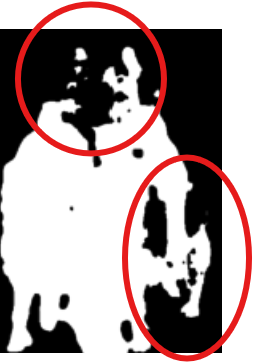
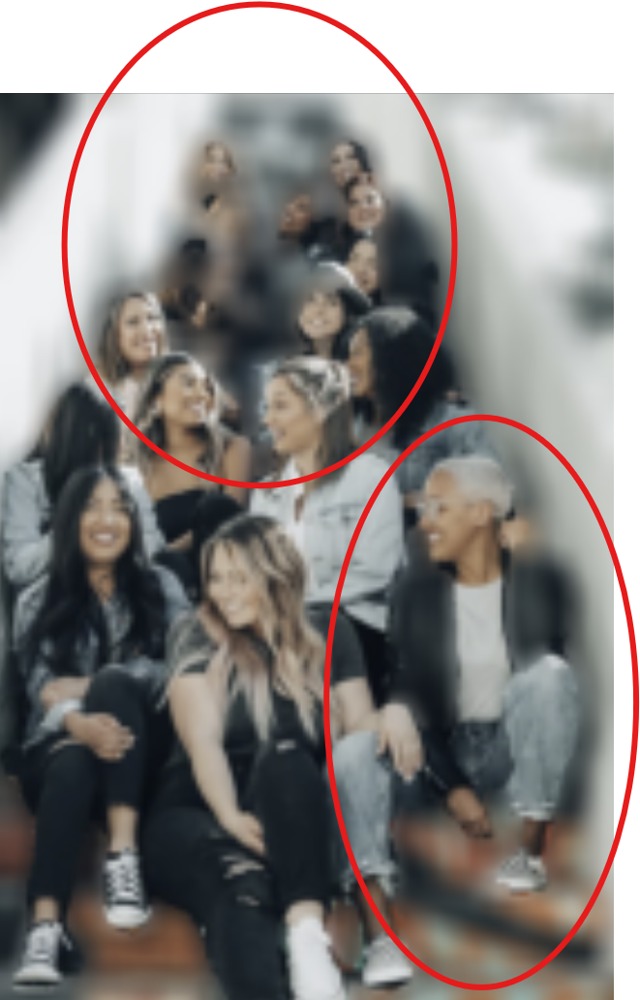<br>
- 사진의 조명/ 색에 따라 인물을 인식하는 정도가 다르다. 왜 이렇게 되는 것인지 또 RGB색이 강할수록 흑백에서 경계색이 뚜렷하지 않을 수록 segmentation이 제대로 되지 않는 것 같다.
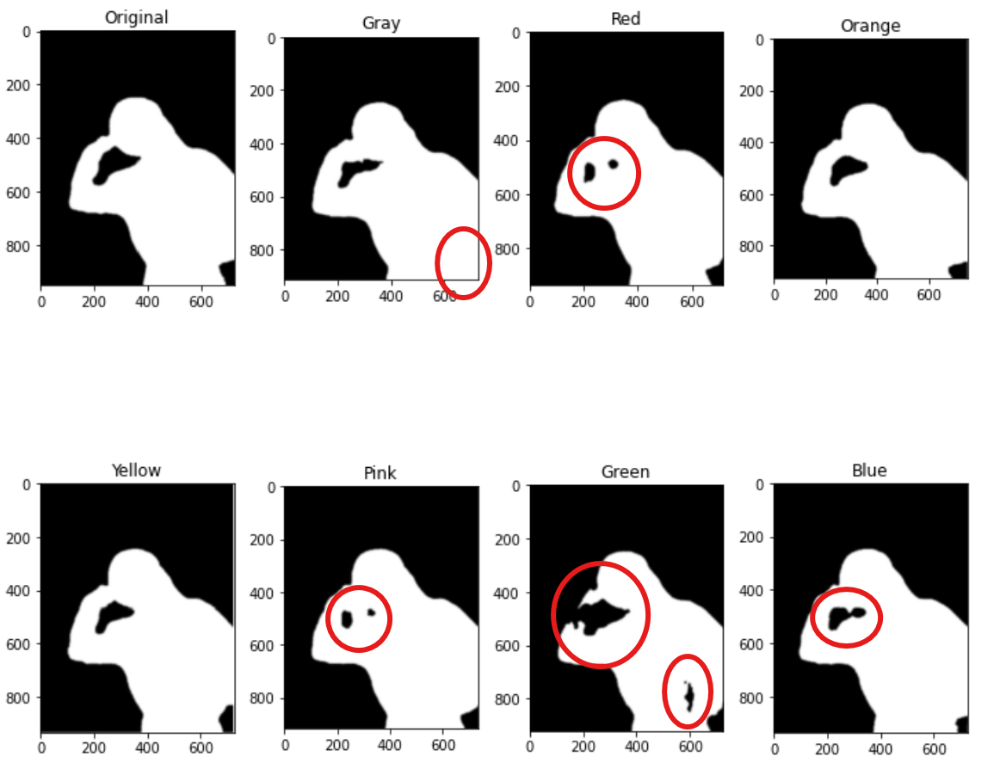<br>
- portrait 모드에서는 앞에 있는 사람만 강조해야하는데 그렇지 못하고 있다.
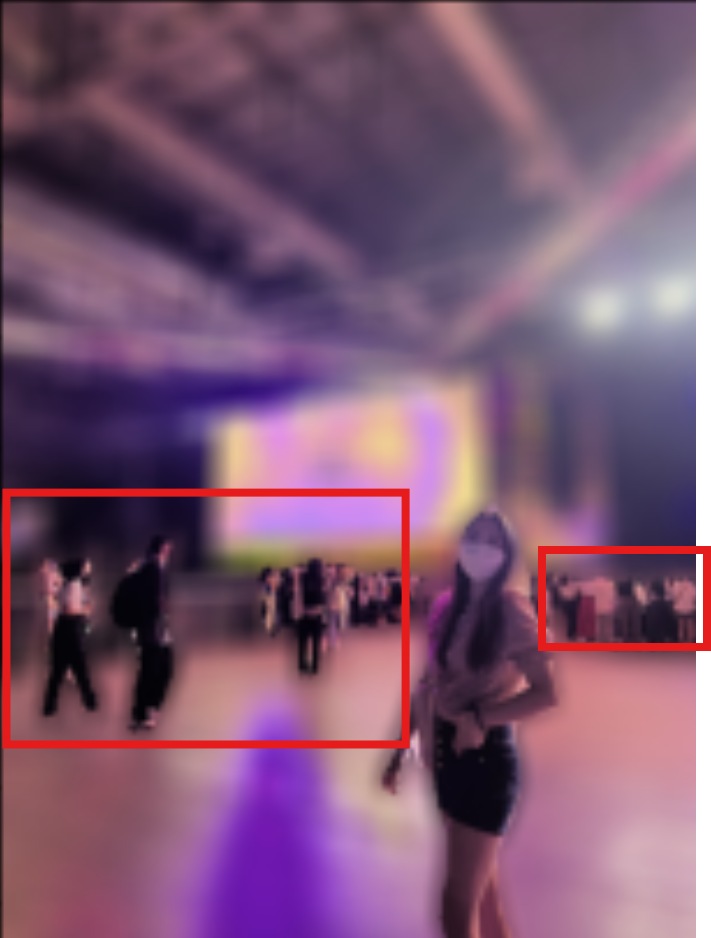


## 동물의 경우
* 고양이

In [103]:
# img path & show image
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/cats.png'
img_orig = img_orig = cv2.imread(img_path)

#### segmentation으로 고양이들을 분리하기

In [104]:
seg_v, output = model.segmentAsPascalvoc(img_path)

In [105]:
#segvalues에 있는 라벨 프린트하기
for class_id in seg_v['class_ids']:
    print(LABEL_NAMES[class_id])
# mask가 씌워진 이미지 프린트하기
seg_map = make_segmap(8, output)
#이미지에서 사람이 있는 위치와 배경을 분리해서 표현한 color_mask를 만든뒤 두 
#이미지를 합쳐서 출력
img_show, img_mask = img_separation(img_orig, seg_map)
# 배경 흐리게 만들기
# (13,13)은 blurring kernel size를 뜻합니다
# 다양하게 바꿔보세요
img_orig_blur = cv2.blur(img_orig, (13,13))
img_mask_color, img_bg_blur = blur_only_bg(img_mask, img_orig_blur)
# 블러 처리된 배경과 사람부분 마스크를 합치기!!

# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고 
# 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)

background
cat
[64  0  0]


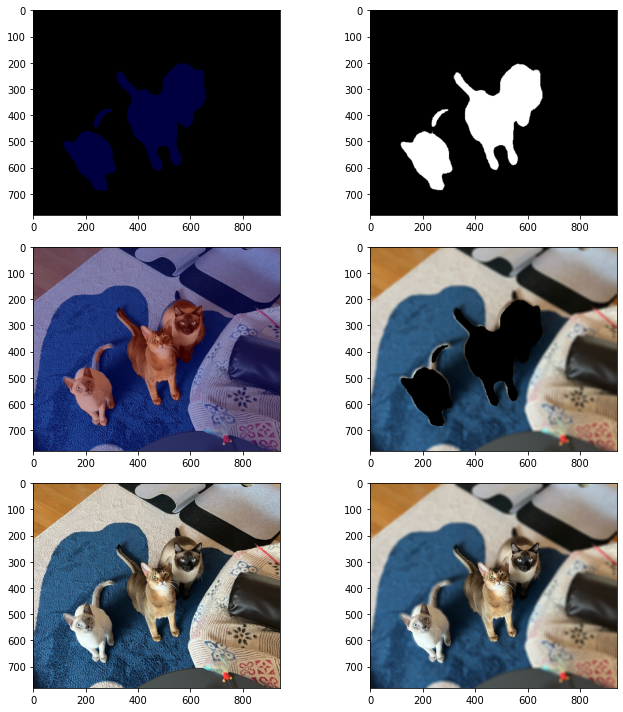

In [106]:
fig, ax =plt.subplots(3,2, figsize=(10,10)) 
ax[0][0].imshow(output) 
ax[0][1].imshow(seg_map, cmap='gray') 
ax[1][0].imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)) 
ax[1][1].imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB)) 
ax[2][0].imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)) 
ax[2][1].imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB)) 

fig.tight_layout()
plt.show()

* 강아지

In [107]:
# img path & show image
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/dog.png'
img_orig = img_orig = cv2.imread(img_path)

#### segmentation으로 강아지를 분리하기

In [108]:
seg_v, output = model.segmentAsPascalvoc(img_path)

In [109]:
#segvalues에 있는 라벨 프린트하기
for class_id in seg_v['class_ids']:
    print(LABEL_NAMES[class_id])
# mask가 씌워진 이미지 프린트하기
seg_map = make_segmap(12, output)
#이미지에서 사람이 있는 위치와 배경을 분리해서 표현한 color_mask를 만든뒤 두 
#이미지를 합쳐서 출력
img_show, img_mask = img_separation(img_orig, seg_map)
# 배경 흐리게 만들기
# (13,13)은 blurring kernel size를 뜻합니다
# 다양하게 바꿔보세요
img_orig_blur = cv2.blur(img_orig, (13,13))
img_mask_color, img_bg_blur = blur_only_bg(img_mask, img_orig_blur)
# 블러 처리된 배경과 사람부분 마스크를 합치기!!

# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고 
# 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)

background
dog
person
sofa
[ 64   0 128]


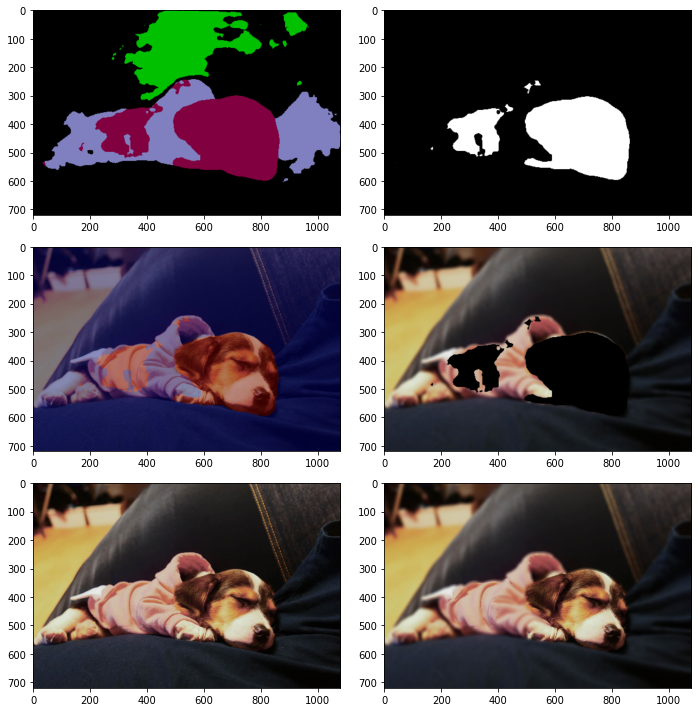

In [110]:
fig, ax =plt.subplots(3,2, figsize=(10,10)) 
ax[0][0].imshow(output) 
ax[0][1].imshow(seg_map, cmap='gray') 
ax[1][0].imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)) 
ax[1][1].imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB)) 
ax[2][0].imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)) 
ax[2][1].imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB)) 

fig.tight_layout()
plt.show()

In [111]:
# img path & show image
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/dog2.png'
img_orig = img_orig = cv2.imread(img_path)

#### segmentation으로 사람을 분리하기

In [112]:
seg_v, output = model.segmentAsPascalvoc(img_path)

In [113]:
#segvalues에 있는 라벨 프린트하기
for class_id in seg_v['class_ids']:
    print(LABEL_NAMES[class_id])
# mask가 씌워진 이미지 프린트하기
seg_map = make_segmap(12, output)
#이미지에서 사람이 있는 위치와 배경을 분리해서 표현한 color_mask를 만든뒤 두 
#이미지를 합쳐서 출력
img_show, img_mask = img_separation(img_orig, seg_map)
# 배경 흐리게 만들기
# (13,13)은 blurring kernel size를 뜻합니다
# 다양하게 바꿔보세요
img_orig_blur = cv2.blur(img_orig, (13,13))
img_mask_color, img_bg_blur = blur_only_bg(img_mask, img_orig_blur)
# 블러 처리된 배경과 사람부분 마스크를 합치기!!

# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고 
# 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)

background
dog
[ 64   0 128]


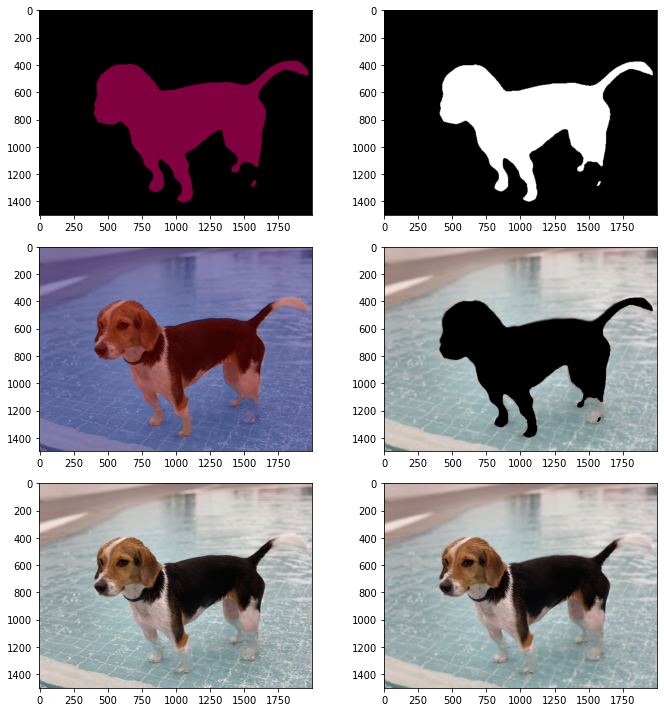

In [114]:
fig, ax =plt.subplots(3,2, figsize=(10,10)) 
ax[0][0].imshow(output) 
ax[0][1].imshow(seg_map, cmap='gray') 
ax[1][0].imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)) 
ax[1][1].imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB)) 
ax[2][0].imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)) 
ax[2][1].imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB)) 

fig.tight_layout()
plt.show()

### 동물사진의 문제점
- 고양이 꼬리를 고양이로 인식하지 않음, 또한 고양이를 제대로 분리하지 못하고 테두리를 포함시키지 못했다.
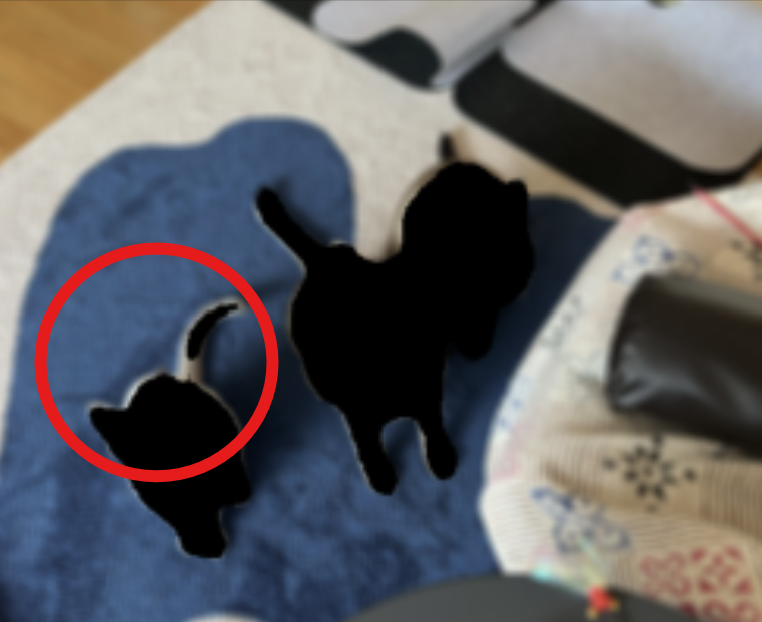<br>
- 강아지 몸 전체를 강아지로 인식하지 못했다, 옷을 입고 있기 때문일까?
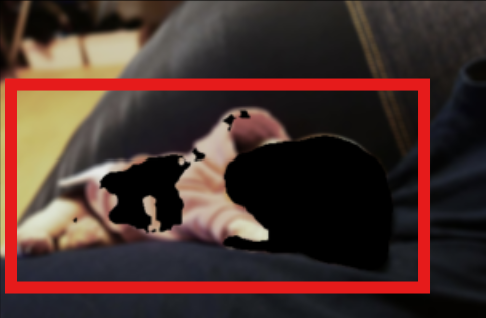<br>
- 옷때문인것 같아 옷을 입지 않은 강아지 사진으로 시도해보았다. 이번에는 강아지를 전체적으로 잘 잡았지만 강아지의 다리가 물속에 있어 강아지의 다리 부분이 제대로 분리되지않았다.
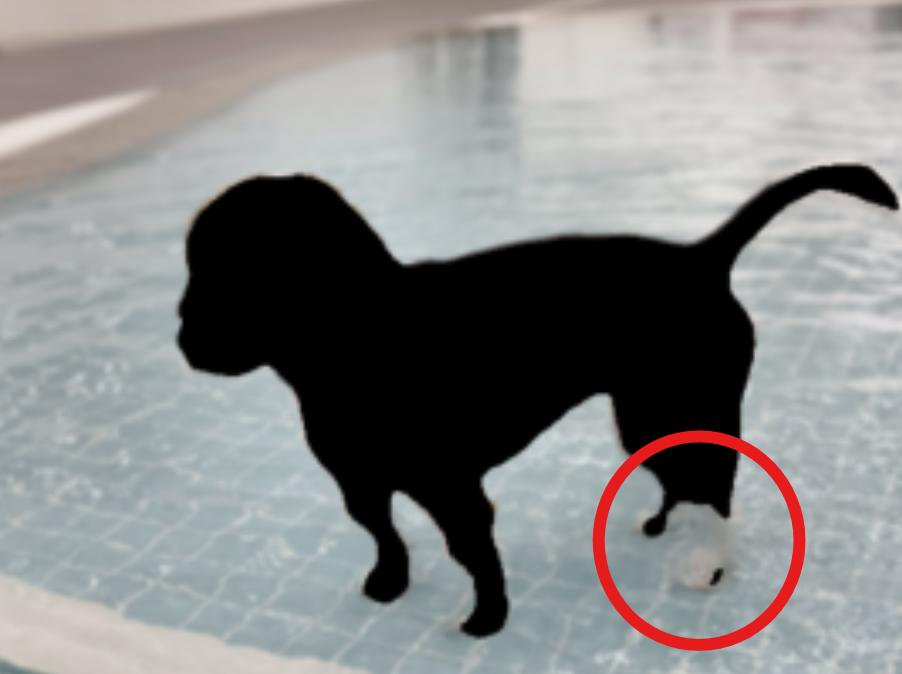<br>

# 해결책
* CFR (Conditional Random Fields)라는 후처리 기법을 이용하여 V포즈나 사람의 머리경계를 더 제대로 다듬을 수 있을 것이다. 
    * CRF는 이미지의 픽셀간의 연관성 즉, 유사성을 측정하기 때문에 세부 경계에 대해 개선을 할 수 있다.
* GrabCut을 이용하여 복잡한 배경이나 물체가 섞여 있을때 제대로 된 분할을 하도록 도와준다.
    * GrabCut은 그래프 컷과 GMM을 사용하는데 이 둘을 사용했을때 물체와 배경을 정확하게 구분할 수 있다. 또한 에너지 최소화 과정이 있어 빠르게 수렴하여 최적의 분할을 얻을 수 있기 때문이다.
* Morphology 연산
    * 이미지의 모양이나 구조를 변경하여 노이즈를 제거하거나 객체를 강조하는데 유용하기 때문에 사람들이 많은 단체 사진의 경우 이 방법을 사용한다면 모든 사람들을 강조하여 분할 할 수 있을 것이다.
* 특정 색상의 조명이나 사진색이 이미지 전체에 영향을 미치기때문에 모델이 객체와 배경을 구분하기 어렵게 만든다. 이는 색에 의해 객체의 경계가 흐려지거나 색상이 왜곡될때 발생한다. 따라서 색상공간을 HSV,LAB등과 같은 다른 색상공간으로 변환하여 모델이 색상 정보 이외에도 명도와 채도 정보를 활용할 수 있게하면 더 성능이 좋은 분할 결과를 낼 수 있을 것이다.
* Depth of Field Simulation나 Focus effect를 강조해 주고 싶은 사람을 제외한 부분을 흐리게 만들 수 있다.
    * DoF simulation은 사진이나 영상에서 깊이 감각을 시각적으로 만들기 때문에 이 작업에 유용할 것으로 판단된다.
    * Focus effect은 특정한 부분을 초점을 맞추고, 그 주변을 흐리게 만들어서 주목도를 높이는 시각적인 효과를 주기 때문에 이에대한 해결책으로 적절하다고 생각한다.

### 느낀점
* 아쉬운 점: 해결책을 찾고서 그것을 적용시켜 제대로 된 portrait mode를 만들어보고 싶었는데 다 하지 못한 점이 너무 아쉽다.
* 사실 색은 바뀌어도 사람의 모습만 보이면 제대로 인식하지 않을까 싶었는데 아니었다는 결과를 알게되어 굉장히 신기했다.